## CASE STUDY ASSIGNMENT 3 - DETECTING SPAM EMAIL

#### Team: Nicole Wittlin, Joe Schueder, Steven Hayden and Kevin Mendonsa

## Introduction

Despite numerous methods to filter out unwanted email, spam still presents a number of challenges to organizations. While ordinary spam is simply considered a nuisance, the true danger lies in the spoofed emails or the malware that it delivers. They fill up inboxes, waste time, and often are carriers of unwanted viruses and malware. Unwanted emails interrupt the workflow of the whole team, and they affect work productivity. Furthermore, they can pose a considerable risk to the security of the company.

Spam includes phishing emails designed to appear legitimate from sources like banks or online merchants. This increases the chance for unwitting users to download suspicious files. The costs to businesses around the world billions of dollars in hampered productivity, security breaches, and other issues.
92.4% of spam email messages contain malware attachments for Ransomware, Malware, Spoofing etc. disrupted IT systems around the world, including those of large enterprises. This cause great reputational damage, especially if the victims are customers. 

Additionally, security experts say that spam is becoming an increasingly successful attack vector, with cybercriminals now aiming to gain access to a computer network and damage it. Organizations have to allocate resources for recovering and securing compromised employee and customer data and pay forensic and legal fees to deal with regulatory bodies and disgruntled customers

It also results in loss of productivity with mailboxes chock-full of irrelevant messages that need filtering wastes a lot of employees’ time. Often it can also result in staff overlooking important correspondence, missing meetings, losing sales and is highly inefficient and frustrating.
(Reference: https://www.graphus.ai/the-impact-of-spam-and-spoofed-emails-on-your-business/)

### Data Processing 

We received the data in an "R data format" file. Since we opted to do this analysis in Python, the Python package "pyreadr" was used to read the data into a Python Pandas dataframe; we then converted the dataframe to a comma separated file (CSV) to store on GitHub for ease of use. Each execution of this Jupyter notebook reads the data from the CSV file on GitHub. 

In [25]:
#import all packages needed
import pandas as pd
import pyreadr
from pandas_profiling import ProfileReport

In [26]:
# Importing the rda dataset using pyreadr and then converting to a dataframe and a csv file - ONLY DONE ONCE, for reference

# import the dataset
# result = pyreadr.read_r(r'C:\Users\jjsch\Downloads\Week_5_Materials_2\data.Rda')

# convert to a dataframe
# df = result["emailDFrp"]

# export dataframe to CSV
# df.to_csv(r'C:\Users\jjsch\Downloads\Week_5_Materials_2\data.csv')

In [27]:
# read and view the data 
df = pd.read_csv(r'https://raw.githubusercontent.com/jjschueder/7333QTW/master/Case%20Study%203/data.csv')
df.head()

,Unnamed: 0,isSpam,isRe,underscore,priority,isInReplyTo,sortedRec,subPunc,multipartText,hasImages,...,subQuesCt,numAtt,numRec,perCaps,hour,perHTML,subBlanks,forwards,avgWordLen,numDlr
0,0,0,T,F,F,T,T,F,F,F,...,0.0,0.0,2.0,4.451039,11.0,0.0,12.500000,0.000000,4.376623,3
1,1,0,F,F,F,F,T,F,F,F,...,0.0,0.0,1.0,7.491289,11.0,0.0,8.000000,0.000000,4.555556,0
2,2,0,F,F,F,F,T,F,F,F,...,0.0,0.0,1.0,7.436096,12.0,0.0,8.000000,0.000000,4.817164,0
3,3,0,F,F,F,F,T,F,F,F,...,0.0,0.0,0.0,5.090909,13.0,0.0,18.918919,3.125000,4.714286,0
4,4,0,T,F,F,F,T,F,F,F,...,0.0,0.0,1.0,6.116643,13.0,0.0,15.217391,6.451613,4.234940,0


Our initial review of the data indicated that many columns are formatted as "logical" data type of TRUE or FALSE. Machine learning classificaton algorithms require numeric variables. Therefore, we converted the TRUE/FALSE variables to numeric class type: TRUE == 1; FALSE == 0. The remaining variables are numeric as they represent percentages, counts, and hours of the day.

In [28]:
# Transform logical data to numeric data
# df['isSpam'] = df['isSpam'].map({'T': 1, 'F': 0})
df['isRe'] = df['isRe'].map({'T': 1, 'F': 0})             
df['underscore'] = df['underscore'].map({'T': 1, 'F': 0})       
df['priority'] = df['priority'].map({'T': 1, 'F': 0})         
df['isInReplyTo'] = df['isInReplyTo'].map({'T': 1, 'F': 0})      
df['sortedRec'] = df['sortedRec'].map({'T': 1, 'F': 0})        
df['subPunc'] = df['subPunc'].map({'T': 1, 'F': 0})          
df['multipartText'] = df['multipartText'].map({'T': 1, 'F': 0})    
df['hasImages'] = df['hasImages'].map({'T': 1, 'F': 0})        
df['isPGPsigned'] = df['isPGPsigned'].map({'T': 1, 'F': 0})       
df['subSpamWords'] = df['subSpamWords'].map({'T': 1, 'F': 0})      
df['noHost'] = df['noHost'].map({'T': 1, 'F': 0})            
df['numEnd'] = df['numEnd'].map({'T': 1, 'F': 0})            
df['isYelling'] = df['isYelling'].map({'T': 1, 'F': 0})         
df['isOrigMsg'] = df['isOrigMsg'].map({'T': 1, 'F': 0})         
df['isDear'] = df['isDear'].map({'T': 1, 'F': 0})            
df['isWrote'] = df['isWrote'].map({'T': 1, 'F': 0})    

## Exploratory Data Analysis 

After confirming the proper type of data frame, we conducted exploratory data analysis to better understand the dataset. Our first step was to understand the variables and their associated meaning in relation to an email message. The data dictionary below provides a summary. Note, the target variable to predict - **IsSpam** - is also included. There is a unique record id - Unnamed: 0 - which is not necessary for our analysis but we retained it for reference as needed.

In [29]:
type(df)

pandas.core.frame.DataFrame

In [30]:
df.columns

Index(['Unnamed: 0', 'isSpam', 'isRe', 'underscore', 'priority', 'isInReplyTo',
       'sortedRec', 'subPunc', 'multipartText', 'hasImages', 'isPGPsigned',
       'subSpamWords', 'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear',
       'isWrote', 'numLines', 'bodyCharCt', 'subExcCt', 'subQuesCt', 'numAtt',
       'numRec', 'perCaps', 'hour', 'perHTML', 'subBlanks', 'forwards',
       'avgWordLen', 'numDlr'],
      dtype='object')

### Data Dictionary

| VARIABLE | DEFINITION |
|:-|:-|
| isSpam | TRUE if email classified as spam |
| isRe | TRUE if Re: appears at the start of subject line |
| numLines | number of lines in body of message |
| bodyCharCt | number of characters in the body of message |
| underscore | TRUE if email address in From field of header contains underscore |
| subExcCt | number of exclamation marks in subject |
| subQuesCt | number of question marks in subject |
| numAtt | number of attachments in message |
| priority | TRUE if Priority key is present in header |
| numRec | number of recipients of message, including CCs |
| perCaps | percentage of capitals among all letters in message |
| isInReplyTo | TRUE if the In-Reply-To key is present in header |
| sortedRec | TRUE if recipients' email addresses are sorted |
| subPunc | TRUE if words in subject have punctuation or numbers embedded (i.e. w!se) |
| hour | hour of the day in the Date field |
| multipartText | TRUE if MIME type is multipart/text |
| hasImages | TRUE if message contains images |
| isPGPsigned | TRUE if message contains a PGP (encryption) signature |
| perHTML | percentage of characters in HTML tags in message compared to all characters |
| subSpamWords | TRUE if subject contains one of the words in spam word vector |
| subBlanks | percentage of blanks in subject |
| noHost | TRUE if there is no hostname in Message-Id key in header |
| numEnd | TRUE if sender's email address (before @) ends in number |
| isYelling | TRUE if subject is in all capital letters |
| forwards | number of forward symbols in a line of the body (i.e. >>> xxx contains 3) |
| isOrigMsg | TRUE if message body contains phrase "original message" |
| isDear | TRUE if message body contains word "dear" |
| isWrote | TRUE if message contains phrase "wrote:" |
| avgWordLen | average length of words in message |
| numDlr | number of dollar signs in message |

In [7]:
profile = ProfileReport(df, title='SpamData_EDA_Report', plot={'histogram': {'bins': 8}}, explorative=True)

profile.to_notebook_iframe()

profile.to_file("SpamData_EDA_Report.html")

## Data Profile Analysis

Next, we dug deeper into the exploratory analysis to understand the descriptive statistics, data distributions, and correlations between variables. Using standard Python operators and the **Pandas Profiling** package, we found some notable characteristics about select variables. We attached the HTML report for further review and can also be accessed at the following link: https://github.com/jjschueder/7333QTW/blob/master/Case%20Study%203/SpamData_EDA_report.html

The complete report can be found on our GitHub page:

-------------------------------------------------------------------------------------------------------------------------------

#### Missing data: 
* subSpam (7 missing)
* noHost (1 missing)
* isYelling (7 missing)
* subExcCt (20 missing)
* subQuesCt (20 missing) 
* numRec (20 missing)
* subBlanks (20 missing)
The Imputation approach we adopted is further outlined below in the document.

#### Missing Values
![title](img/MissingValues2.png) 


#### Missing Values - Heatmap
![title](img/MissingValuesHeatMap2.png) 


#### Data Issues and Warnings
![title](img/DataWarnings.png) 

-------------------------------------------------------------------------------------------------------------------------------

### Outliers and Correlations

**Pearson's Correlation**

The Pearson correlation coefficient is used to measure the strength of a linear association between two variables, where the value r = 1 means a perfect positive correlation and the value r = -1 means a perfect negataive correlation. It inofrms whether a statistically significant linear relationship exists between two continuous variables. The strength of a linear relationship (i.e., how close the relationship is to being a perfectly straight line) 

(Reference: https://www.dummies.com/education/math/statistics/how-to-interpret-a-correlation-coefficient-r/)

Interpretation of Pearson's coefficient.
* Exactly –1. A perfect downhill (negative) linear relationship

* –0.70. A strong downhill (negative) linear relationship

* –0.50. A moderate downhill (negative) relationship

* –0.30. A weak downhill (negative) linear relationship

* 0. No linear relationship

* +0.30. A weak uphill (positive) linear relationship

* +0.50. A moderate uphill (positive) relationship

* +0.70. A strong uphill (positive) linear relationship

* Exactly +1. A perfect uphill (positive) linear relationship

![title](img/PearsonCorrelation.png) 

-------------------------------------------------------------------------------------------------------------------------------

**PHI Correlation**

The phi correlation coefficient (phi) is one of a number of correlation statistics used to measure the strength of association between two variables. It is a nonparametric statistic used in cross-tabulated data where both variables are dichotomous. The phi coefficient (or mean square contingency coefficient and denoted by φ or rφ) is a measure of association for two binary variables. 

Interpretation of the Phi coefficient.
* -1.0 to -0.7 strong negative association. 
* -0.7 to -0.3 weak negative association. 
* -0.3 to +0.3 little or no association.

![title](img/PhikCorrelation.png)

Outliers / Odd data:
* Outliers correlated with isSpam: 
    - numRec - with 311 recipients
    - perCaps - 100% capital letters in email (>80% was spam threshold for perCaps)
    - perHTML - 100% HTML characters (>97% was spam threshold for perHTML)
    - subBlanks - 86% blanks in subject (>25% was spam threshold for subBlanks)
    - Average word length of 26 is a spam outlier


* Outliers not correlated with isSpam: 
    - count of question marks in subject (8 and 12 outliers were not spam)
    - greatest number of attachments at 18 (not spam)
    - number of forwards at 99 (not spam)
    - large number of dollar signs at 1977 (not spam)

-------------------------------------------------------------------------------------------------------------------------------

In [31]:
df.describe()

,Unnamed: 0,isSpam,isRe,underscore,priority,isInReplyTo,sortedRec,subPunc,multipartText,hasImages,...,subQuesCt,numAtt,numRec,perCaps,hour,perHTML,subBlanks,forwards,avgWordLen,numDlr
count,9348.000000,9348.000000,9348.000000,9348.000000,9348.000000,9348.000000,9348.000000,9348.000000,9348.000000,9348.000000,...,9328.000000,9348.000000,9066.000000,9348.000000,9348.000000,9348.000000,9328.000000,9348.000000,9348.000000,9348.000000
mean,4673.500000,0.256418,0.321459,0.013479,0.005777,0.298674,0.898588,0.028134,0.035088,0.002353,...,0.137757,0.065789,1.929407,8.850371,12.210847,6.517082,13.866939,10.445086,4.487222,1.781558
std,2698.679492,0.436679,0.467062,0.115319,0.075788,0.457701,0.301890,0.165365,0.184011,0.048458,...,0.507685,0.324879,5.242396,9.583415,6.623932,19.135266,7.431938,18.263576,0.568582,30.380455
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.363072,0.000000
25%,2336.750000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,4.255319,8.000000,0.000000,10.526316,0.000000,4.208257,0.000000
50%,4673.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,6.055473,13.000000,0.000000,13.253012,0.000000,4.454545,0.000000
75%,7010.250000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,9.059399,18.000000,0.000000,15.686275,15.384615,4.728507,0.000000
max,9347.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,12.000000,18.000000,311.000000,100.000000,23.000000,100.000000,86.419753,99.058270,26.000000,1977.000000


### MISSING VALUES: ANALYSIS and IMPUTATION STRATEGY

In [32]:
# Missing Data Summary
countOfNan = pd.Series(df.isnull().sum()) 
DataType = pd.Series(df.dtypes) 

# Assemble into a single dataframe for viewing
frame = { 'datatype': DataType, 'count of Nan': countOfNan } 
result = pd.DataFrame(frame) 
print(result)

              datatype  count of Nan
Unnamed: 0       int64             0
isSpam           int64             0
isRe             int64             0
underscore       int64             0
priority         int64             0
isInReplyTo      int64             0
sortedRec        int64             0
subPunc          int64             0
multipartText    int64             0
hasImages        int64             0
isPGPsigned      int64             0
subSpamWords   float64             7
noHost         float64             1
numEnd           int64             0
isYelling      float64             7
isOrigMsg        int64             0
isDear           int64             0
isWrote          int64             0
numLines         int64             0
bodyCharCt       int64             0
subExcCt       float64            20
subQuesCt      float64            20
numAtt         float64             0
numRec         float64           282
perCaps        float64             0
hour           float64             0
p

As observed above, we have missing values in the dataset.  However, to improve the classification results of Spam we adopted the following approaches to address missing values in our dataset .

**Imputation approach for Variables: subExcCt, subQuesCt, subBlanks, isYelling, subSpamWords**
* Given the large dataset of 9348 observations, we opted to drop the 20 rows that were missing data in the variables “subExcCt”, “subQuesCt”, and “subBlanks”. 
* The missing values associated with these three variables were all absent in the same observations/rows; therefore, only 20 observations were excluded in the dataset. 
* We felt this was an appropriate step given it represented only **0.2%** of the overall dataset. 
* Dropping these observations/records also eliminated the missing values in the variables “isYelling” and “subSpamWords.”


**Imputation approach for Variable: numRec**
* The variable number of recipients (numRec) has the most missing values at 282. 
* We decided to impute the missing values with the mean number of recipients. 
* This imputation was done after splitting the data into training and testing datasets. 
* The mean was calculated using only the training dataset. 
* We felt this would most closely mimic a production environment and limit "data leakage" between the training and testing datasets. 
* We used the Pipeline approach as indicated below to address this imputation as one opf the steps in the pipeline.


**Imputation approach for Variable: noHost**
* The remaining missing data point was one value for “noHost"; we imputed this with the mean. 
* We used the Pipeline approach as indicated below to address this imputation as one opf the steps in the pipeline.

In [33]:
# Create a new dataset after filtering out NaNs for variable subQuesCt 
# which also addressed NaNs in subExcCt, subBlanks, isYelling and subSpamWords

dfNoNa = df[~df['subQuesCt'].isnull()]

## Splitting the Data

#### Using Python's Data Split method from scikit learn which is equivalent to R's split() function

We used the ShuffleSplit method which randomly samples the entire dataset during each iteration to generate a training set and a test set. The test_size and train_size parameters determines how the percentage size of the test and training test for each iteration. Since we are sampling from the entire dataset during each iteration, values selected during one iteration, could be selected again during another iteration. (Reference: https://stackoverflow.com/questions/34731421/whats-the-difference-between-kfold-and-shufflesplit-cv)

The settings we used for the ShuffleSplit are:
* n_splits=10
* random_state=101 
* test_size=0.2 (20% testing set)
* train_size=None (80% training set)


In [34]:
# Split the data into test and train using scikit learn built-ins
from sklearn.model_selection import ShuffleSplit
cvx = ShuffleSplit(n_splits=10, test_size=0.20, random_state=101)
print (cvx)

ShuffleSplit(n_splits=10, random_state=101, test_size=0.2, train_size=None)


In [35]:
# Determine the features to be used for the independent variables and those for the dependent or response variable
features = ['isRe', 'underscore', 'priority', 'isInReplyTo',
            'sortedRec', 'subPunc', 'multipartText', 'hasImages', 'isPGPsigned',
            'subSpamWords', 'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear',
            'isWrote', 'numLines', 'bodyCharCt', 'subExcCt', 'subQuesCt', 'numAtt',
            'numRec', 'perCaps', 'hour', 'perHTML', 'subBlanks', 'forwards',
            'avgWordLen', 'numDlr']

X = dfNoNa[features].copy()
Y = dfNoNa[['isSpam']].copy()
y = Y.values

### Q1: BUILD/EVALUATE TREE-BASED MODEL FOR PREDICTING "SPAM" EMAIL

#### INITIAL GRID SEARCH MODEL PARAMETERS AND APPROACH 

For the GridSearch, we definede a range of options for min_samples_leaf, which indicates the number of sample observations required at a leaf node split. We also specified a range of options for max_depth, which is the maximum depth allowed for the Decision Tree. The range of values selected are considered standard.

We used all the features and the following steps:

- The data is split into random training and testing datasets using the ShuffleSplit method and 80/20 split
- The missing values are imputed as per our imputation approach above.  
- A grid search mechanism is then leveraged to train models based on the following parameters:
      - classify__criterion':['gini','entropy']
      - classify__max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]
      - classify__min_samples_leaf': min_samples_leaf_range
      - classify__max_features': ['auto','auto', 'log2']
- The model is scored using the accuracy metric
- The model with the best accuracy is then selected as the baseline

In [36]:
# grid search to determine optimal model and parameters for baselining
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier

min_samples_leaf_range = [2,3,4,5,6,7,8,9,10,11,15,20,30,40,50,75,100,150]

# Create a dictionary of all the parameter options 
# Note has you can access the parameters of steps of a pipeline by using '__’

parameters ={'classify__criterion':['gini','entropy'],
             'classify__max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150],
             'classify__min_samples_leaf': min_samples_leaf_range,
             'classify__max_features': ['auto','auto', 'log2']}

Pipeline = Pipeline([("imputer", SimpleImputer(missing_values = np.nan, strategy = 'mean')),
                     ("classify",DecisionTreeClassifier())])

In [37]:
# the cv=cvx parameter sets the grid search to split the training and testing data 10 times. 
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, TimeSeriesSplit, StratifiedShuffleSplit
from sklearn import metrics as mt
X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size = 0.2, random_state = 101)
dt_clf = GridSearchCV(Pipeline, param_grid = parameters, cv = cvx)

# train the decision tree algorithm
%time dt_clf.fit(X,y)
yhat = dt_clf.best_estimator_.predict(X1_test)
print ('accuracy:', mt.accuracy_score(y1_test,yhat))
print (dt_clf.best_params_)

Wall time: 9min 4s
accuracy: 0.9844587352625938
{'classify__criterion': 'entropy', 'classify__max_depth': 150, 'classify__max_features': 'auto', 'classify__min_samples_leaf': 2}


### SUMMARY OF GRID SEARCH 

GridSearch Results -- A Baseline Model
With our dataset now complete (implemented imputation strategy) and split into random training and test sets using an 80/20 split and h ShuffleSplit method, we started a more comprehensive analysis to determine whether or not an email Is Spam. We leveraged the GridSearchCV from "sklearn" to obtain an exhaustive compilation of specified parameter values for an estimator. The GridSearch for our Decision Tree model returned 1944 options with outputs related to time to run the model, recommended parameters, and mean test score (which is accuracy). To quickly assess these options, we explored the results based on accuracy. 

The GridSearch identified a model with close to 98% accuracy. The model had a depth of 40 and required only two samples at each split. The large depth and small samples for a split resulted in very complex model. This complexity makes interpretability quite difficult.  It did not meet our goal to have a model that is easily understood by non-technical audiences. We reviewed and analyzed the estimators to determine and develop a more manageable Decision Tree. 


**RESULTS:**
* Wall time: 8min 48s

* Accuracy: 0.9871382636655949 (99%)

* Parameters: {'classify__criterion': 'entropy', 'classify__max_depth': 30, 'classify__max_features': 'auto', 'classify__min_samples_leaf': 2}



**ANALYSIS:**

The "OPTIMAL" parameters determined by GRID SEARCH algorithm for the BEST model are:

* Criterion: The GridSearch algorithm selected the "GINI" coefficient as the criterion being optimal versus "Entropy" 

* Max_depth: The decision tree produced is much deeper at depth=40 branches/levels

* Max_features: The feature selection was left to the GRID SEARCH algorithm using the 'auto' option

* Min_samples_leaf: 2

* Accuracy of identifying SPAM while very high at 98% makes the model interpretability more complex


In [38]:
# Capture the cv results/estimators in a dataframe for review and further analysis
estimatorsdf = pd.DataFrame(dt_clf.cv_results_)

# the estimators can be downloaded as a csv for further analysis to determine optimal pruning opportunities
# estimatorsdf.to_csv(r'C:\Users\kevinm\Documents\GitHub\7333QTW\Case Study 3\Estimators.csv')

estimatorsdf

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classify__criterion,param_classify__max_depth,param_classify__max_features,param_classify__min_samples_leaf,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.020770,0.003172,0.002200,0.000402,gini,4,auto,2,"{'classify__criterion': 'gini', 'classify__max...",0.865488,...,0.879957,0.870311,0.834941,0.856377,0.844051,0.844051,0.810825,0.849250,0.018734,1843
1,0.017293,0.001269,0.002296,0.000461,gini,4,auto,3,"{'classify__criterion': 'gini', 'classify__max...",0.868167,...,0.804930,0.863344,0.836549,0.842980,0.826367,0.861736,0.830654,0.845016,0.019347,1871
2,0.017165,0.001595,0.002200,0.000399,gini,4,auto,4,"{'classify__criterion': 'gini', 'classify__max...",0.849946,...,0.828510,0.870311,0.855841,0.851018,0.871383,0.842980,0.825295,0.851179,0.014834,1829
3,0.018489,0.002458,0.002626,0.000990,gini,4,auto,5,"{'classify__criterion': 'gini', 'classify__max...",0.877278,...,0.866559,0.876206,0.825831,0.842444,0.847803,0.863344,0.877814,0.860986,0.018417,1722
4,0.019186,0.002266,0.002102,0.000299,gini,4,auto,6,"{'classify__criterion': 'gini', 'classify__max...",0.842444,...,0.860665,0.829046,0.881565,0.825295,0.835477,0.866559,0.849946,0.852251,0.019376,1815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1939,0.025488,0.003075,0.002399,0.000489,entropy,150,log2,40,"{'classify__criterion': 'entropy', 'classify__...",0.881029,...,0.904609,0.895498,0.903001,0.900857,0.901929,0.881029,0.908360,0.896034,0.009204,1137
1940,0.022858,0.002118,0.002894,0.001507,entropy,150,log2,50,"{'classify__criterion': 'entropy', 'classify__...",0.899786,...,0.851554,0.899250,0.896570,0.904609,0.885316,0.901929,0.898714,0.891050,0.014753,1231
1941,0.021118,0.002335,0.002911,0.001162,entropy,150,log2,75,"{'classify__criterion': 'entropy', 'classify__...",0.899786,...,0.884244,0.883173,0.884244,0.823151,0.870847,0.899250,0.878885,0.882208,0.022079,1373
1942,0.021787,0.001938,0.002731,0.000662,entropy,150,log2,100,"{'classify__criterion': 'entropy', 'classify__...",0.872990,...,0.852090,0.858521,0.856377,0.861736,0.830654,0.878349,0.872454,0.857556,0.016336,1769


### Q3: EXPLAIN PARAMETERS INVOLVED IN "PRUNING" THE MODEL

#### Parameters
To fully understand the results of the GridSearch, it is important to understand the parameters used by the Decision Tree classifier.  Pruning the tree involves selecting the most optimal combinations to tune the model that will deliver a good balance of model accuracy and interpretability. 

A summary of definitions of the parameters we used for the GridSearch are below. In addition, there are also other parameters that we did not use.


| Parameter                | Definition                                                                                                                                                                                  |
|:-------------------------|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Criterion                | function to measure the quality of a split; supported criteria are "gini" for Gini impurity and "entropy" for information gain                                                              |
| Splitter                 | strategy used to choose the best split at each node; supported strategies are "best" to choose best split and "random"  to choose best random split                                              |
| Max_depth                | maximum depth of tree; if "None", then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples                                           |
| Min_samples_leaf         | minimum number of samples required at a leaf node; split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each left and right branches |
| Max_features             | number of features to consider when looking for best split                                                                                                                                  |


### PRUNING THE MODEL

Explain the rationale for our decisions, how that impacted from base model
The grid search found a model with very good accuracy of 98%. However, the model is extremely complex and has a depth of 120 branches. An evaluation of all the models evaluated shows that tree with a much smaller branch depth is also capable of producing a fairly accurate tree, with fewer branches.  This simpler tree better describes the important features in a more compact manner and is easier to interpret.

#### Parameters selected for pruning

* criterion: 'gini'
* max_depth': 7
* max_features: 'auto'
* min_samples_leaf: 2

As noted above, our goal is to define an interpretable Decision Tree with strong accuracy. To narrow down the 1944 GridSearch results, we looked at models with accuracy greater then 0.90. Acknowledging that a model with higher accuracy would likely require more depth, we felt like 0.90 was an appropriate threshold. To achieve a simplier model, we will need to trade off some accuracy for a tree with less depth.  

##### The "Optimized" Decision Tree parameters we ultimately selected for the model can be summarized as follows:
                                      
                                        
| Parameter | Value | Explanation |
|:-|:-|:-|
| Criterion | Gini | function to measure the quality of a split; supported criteria are "gini" for Gini impurity and "entropy" for information gain |
| Splitter | Best | strategy used to choose best split at each node; supported strategies are "best" to choose best split and "random  to choose best random split |
| Max_depth | 7 | maximum depth of tree; if None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples |
| Min_samples_leaf | 2  | minimum number of samples required at a leaf node; split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each left and right branches |
| Max_features | Auto  | number of features to consider when looking for best split |

In [39]:
# PRUNED Model using max_dept=7 and min_samples_leaf=2 with "GINI" as a criterion
from sklearn.pipeline import Pipeline
clf = Pipeline([("imputer", SimpleImputer(missing_values = np.nan, strategy = 'mean')),
                ("classify",DecisionTreeClassifier(**{'criterion': 'gini', 
                                                      'max_depth': 7, 
                                                      'max_features': 'auto', 
                                                      'min_samples_leaf': 2}))])

clf.fit(X1_train,y1_train)
yhat2 = clf.predict(X1_test)
print ('accuracy:', mt.accuracy_score(y1_test,yhat2))
print (clf)

accuracy: 0.897642015005359
Pipeline(memory=None,
         steps=[('imputer',
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='mean',
                               verbose=0)),
                ('classify',
                 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                        criterion='gini', max_depth=7,
                                        max_features='auto',
                                        max_leaf_nodes=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=2, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        presort='deprecated', random_state=None,
                                        splitter='best'))],
         v

###  DECISION TREE MODEL EVALUATION AND SELECTION BASED ON METRICS

In order to evaluate the model, we reviewed several standard metrics, which are defined below. The aim is to maximize our precision, recall, and accuracy scores in our models.

* **MODEL ACCURACY**: 0.8831725616291533 (88%)

  
* **ACCURACY** - total number of correct predictions (True Positives/TP; True Negatives/TN) over total number of predictions made. <br>
Accuracy = (TP + TN)/(TP + FP + FN + TN)


* **PRECISION** - proportion of true positives over total number of positive outcomes, whether accurately predicted (TP) or inaccurately predicted (FP); helps illuminate which model is accurately picking correct classes or correctly classifying observations.<br>
Precision = (TP) / (TP + FP)


* **RECALL** - proportion of positive outcomes that were correctly classified by model; tells how many values were incorrectly predicted; a good pair with precision to determine if modeling is overfitting or selecting a single class; also known as sensitivity.  
Recall/Sensitivity = (TP) / (TP + FN) 


* **F1 SCORE** - measure of accuracy that accounts for true negatives and false positives.<br>
F1 score = 2(True Positive Rate * True Negatives)/(True Positives + True Negatives) 


We further plotted an **ROC curve** to visualize the Decision Tree's performance. An ROC curve, also known as a Reciever Operation Characteristic Curve, plots and compares classifiers based on the True Positive Rates (TPR) and False Positive Rates (FPR) for each classifier. An AUC (Area Under the Curve) score of 1.0 denotes a perfect classifier and an area of 0.5 represents a model which is no better than a random guess. Higher the AUC the better the classifier.


In [40]:
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
for fold, (train, test) in enumerate(cvx.split(X,y)):
    print ('Next Evaluation:')
    # train the decision tree algorithm
    clf.fit(X.iloc[train],y[train])
    yhat = clf.predict(X.iloc[test])
    print ('accuracy:', mt.accuracy_score(y[test],yhat),'\n')
    conf = mt.confusion_matrix(y[test],yhat)
    print("Confusion Matrix\n",conf,'\n')
    print("Precision Score is: {}" .format(precision_score(y[test],yhat, average='weighted')),'\n')
    print("Recall Score is: {}" .format(recall_score(y[test],yhat, average='weighted')),'\n')
    print("F1 Score is: {}" .format(f1_score(y[test],yhat, average='weighted')),'\n')

Next Evaluation:
accuracy: 0.8740621650589496 

Confusion Matrix
 [[1344   70]
 [ 165  287]] 

Precision Score is: 0.8696464217448394 

Recall Score is: 0.8740621650589496 

F1 Score is: 0.8687143364714732 

Next Evaluation:
accuracy: 0.8944265809217578 

Confusion Matrix
 [[1311   77]
 [ 120  358]] 

Precision Score is: 0.8922799441415278 

Recall Score is: 0.8944265809217578 

F1 Score is: 0.8927456491361521 

Next Evaluation:
accuracy: 0.8944265809217578 

Confusion Matrix
 [[1342   34]
 [ 163  327]] 

Precision Score is: 0.8954029175154844 

Recall Score is: 0.8944265809217578 

F1 Score is: 0.8887884193016578 

Next Evaluation:
accuracy: 0.9040728831725616 

Confusion Matrix
 [[1298   73]
 [ 106  389]] 

Precision Score is: 0.9026137016490713 

Recall Score is: 0.9040728831725616 

F1 Score is: 0.9029893448165982 

Next Evaluation:
accuracy: 0.8853161843515541 

Confusion Matrix
 [[1366   28]
 [ 186  286]] 

Precision Score is: 0.8879133949816651 

Recall Score is: 0.8853161843515

### Q4: WHICH VARIABLES ARE "MOST" IMPORTANT?

In [41]:
# Merge field names and feature importance to display them together
fi = pd.DataFrame(clf.steps[1][1].feature_importances_, columns =['featimp'])
featuresnames = pd.DataFrame(X1_test.columns.values.tolist(), columns =['fields'])

featimpdf = pd.merge(featuresnames, fi, left_index=True, right_index=True)
featimpdf = featimpdf.sort_values(by='featimp', ascending=False)
featimpdf

,fields,featimp
3,isInReplyTo,0.239349
22,perCaps,0.228680
16,numLines,0.171683
25,subBlanks,0.082747
24,perHTML,0.055959
18,subExcCt,0.053873
11,numEnd,0.043393
12,isYelling,0.027191
15,isWrote,0.023885
28,numDlr,0.023573


### ANALYSIS OF VARIABLES CONTRIBUTING THE MOST TO THE MODEL

The final part of our analysis was to explore feature importance.  This illustrates which variables in the dataset are most likely predictors of spam. The list below captures the results from our model and aligns with the Decision Tree path we outlined above.

The features determined to be the most important to our model are:
* perCaps
* perHTML
* bodyCharCt
* forwards
* numDlr
* isInReplyTo
* avgWordLen
* isWrote

The bar-chart below further illustrates the feature importance and their order of importance to the Decision Tree.

[Text(0, 0, 'isInReplyTo'),
 Text(0, 0, 'perCaps'),
 Text(0, 0, 'numLines'),
 Text(0, 0, 'subBlanks'),
 Text(0, 0, 'perHTML'),
 Text(0, 0, 'subExcCt'),
 Text(0, 0, 'numEnd'),
 Text(0, 0, 'isYelling'),
 Text(0, 0, 'isWrote'),
 Text(0, 0, 'numDlr'),
 Text(0, 0, 'multipartText'),
 Text(0, 0, 'forwards'),
 Text(0, 0, 'numRec'),
 Text(0, 0, 'hour'),
 Text(0, 0, 'avgWordLen'),
 Text(0, 0, 'bodyCharCt'),
 Text(0, 0, 'numAtt'),
 Text(0, 0, 'subQuesCt'),
 Text(0, 0, 'isRe'),
 Text(0, 0, 'underscore'),
 Text(0, 0, 'isOrigMsg'),
 Text(0, 0, 'noHost'),
 Text(0, 0, 'subSpamWords'),
 Text(0, 0, 'isPGPsigned'),
 Text(0, 0, 'hasImages'),
 Text(0, 0, 'subPunc'),
 Text(0, 0, 'sortedRec'),
 Text(0, 0, 'priority'),
 Text(0, 0, 'isDear')]

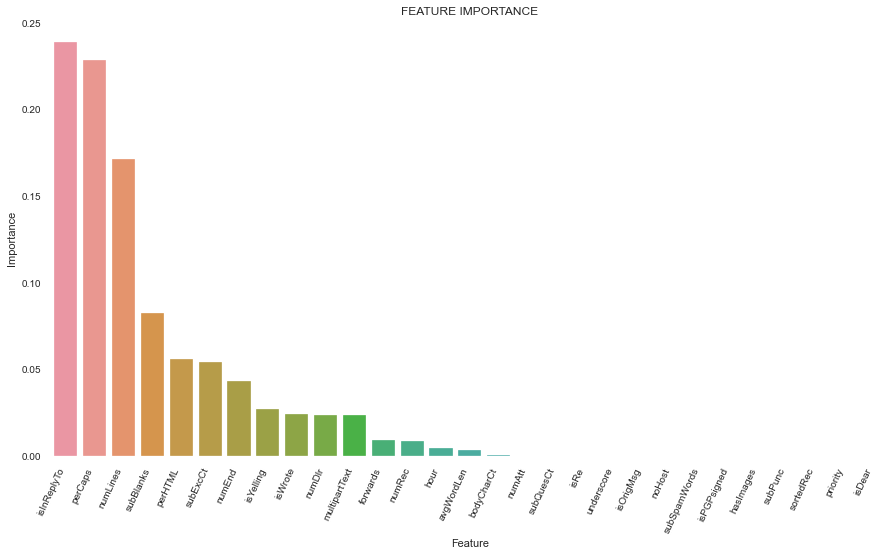

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(15,8))
ax = sns.barplot(x=featimpdf.fields, y=featimpdf.featimp)
ax.set_title('FEATURE IMPORTANCE')
plt.xlabel("Feature")
plt.ylabel("Importance")
ax.set_xticklabels(ax.get_xticklabels(), rotation=65, horizontalalignment='right')

### Q2: PLOT/ANALYZE PATHS THROUGH TREE

Explain a path or two
what did we learn?
what do the splits tell us? 

In [63]:
from sklearn import tree
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (50,20), dpi = 300)

tree.plot_tree(clf.steps[1][1]);

In [64]:
cn = ['Spam', 'NotSpam']
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (50,20), dpi = 300)

tree.plot_tree(clf.steps[1][1],
               feature_names = features, 
               class_names=cn,
               filled = True);
# fig.savefig(r'C:\Users\jjsch\Downloads\Week_5_Materials_2\plottreefncn.png')

In [65]:
# export the decision tree to a dot file
from graphviz import Digraph
from graphviz import Source
from io import StringIO
import pydot
import graphviz

tree.export_graphviz(clf.steps[1][1],
                     out_file=(r"C:\Users\kevinm\Documents\GitHub\7333QTW\Case Study 3\tree.dot"),
                               #(r"C:\Users\jjsch\Downloads\Week_5_Materials_2\tree.dot"),
                     feature_names = features, 
                     class_names=cn,
                     filled = True)

dotfile = StringIO()

In [66]:
# export to PDF for easier zooming and viewing of the decision tree. 
dot_data = tree.export_graphviz(clf.steps[1][1], out_file=None, feature_names=features)
graph = graphviz.Source(dot_data) 
graph.render("name of file",view = True)

ExecutableNotFound: failed to execute ['dot', '-Tpdf', '-O', 'name of file'], make sure the Graphviz executables are on your systems' PATH

### Q5: EVALUATE PERFORMANCE OF MODEL

Confusion Matrix to show classification 

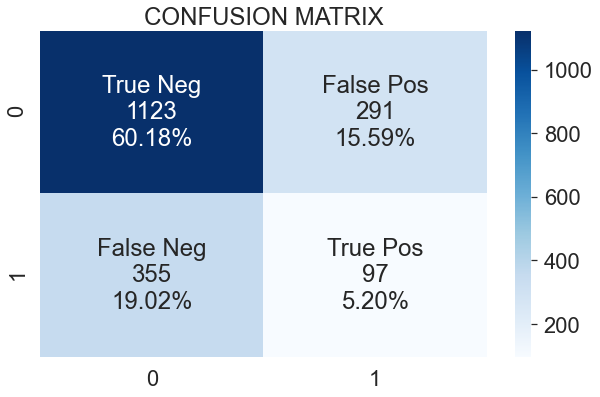

In [83]:
import numpy as np
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, auc, roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

plt.figure(figsize=(10, 6))
sns.set(font_scale=2)
plt.title('CONFUSION MATRIX')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

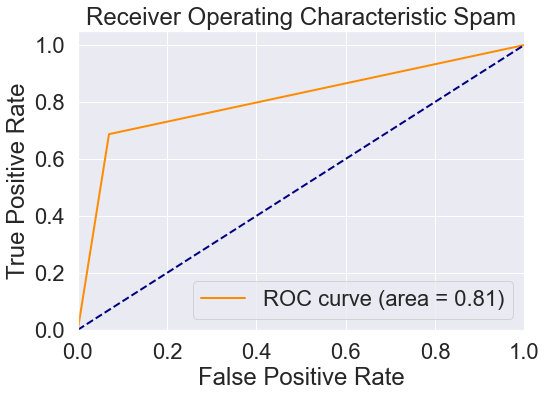

In [84]:
#X1_train, X1_test, y1_train, y1_test
#y_score = classifier.fit(X_train3, y_train3).decision_function(X_test3)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):

    #y1_test,yhat    
    fpr[i], tpr[i], _ = roc_curve(ybinary, y_score)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(ybinary.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

#Plot of a ROC curve for a specific class
plt.figure()
lw = 2
plt.plot(fpr[i], tpr[i], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Spam')
plt.legend(loc="lower right")
plt.show()

In [85]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

#https://graphviz.gitlab.io/_pages/Download/Download_windows.html

ylist = Y.values.astype('int64')
ylist
from sklearn.preprocessing import label_binarize
ybinary = label_binarize(ylist, classes=[0, 1])
n_classes = ybinary.shape[1]
X_train2, X_test2, y_train2, y_test2 = train_test_split(X,ybinary, test_size=0.2)
y_score = cross_val_predict(clf, X, ybinary, cv=10 ,method='predict')
from sklearn.preprocessing import label_binarize
ybinary = label_binarize(ylist, classes=[0, 1])
n_classes = ybinary.shape[1]
X_train2, X_test2, y_train2, y_test2 = train_test_split(X,ybinary, test_size=0.2)
y_score = cross_val_predict(clf, X, ybinary, cv=10 ,method='predict')

### SUMMARY/CONCLUSION/FINAL THOUGHTS

 COnfusion Matrices:
 


The aim of our modeling is to focus on maximizing our precision, recall, and accuracy scores in our models  


SUMMARY/CONCLUSION/FINAL THOUGHTS
WRITE RECAP of RESULTS AND EXPLAIN WHAT WE'D TELL COLLEAGUES

## APPENDIX

#### Backup evaluation of complex model
The evaluation below shows cross validation of the deeper tree model with more branches.  Accuracy and other metrics are better.

In [ ]:
dt_clf=DecisionTreeClassifier(**dt_clf.best_params_)
dt_clf.fit(X1_train,y1_train)
yhat = dt_clf.predict(X1_test)
print ('accuracy:', mt.accuracy_score(y1_test,yhat))


fi_dt = pd.DataFrame(dt_clf.feature_importances_, columns =['featimp'])
featuresnames_dt = pd.DataFrame(X1_test.columns.values.tolist(), columns =['fields'])
featimpdt_df = pd.merge(featuresnames_dt, fi_dt, left_index=True, right_index=True)
featimpdt_df = featimpdf.sort_values(by='featimp', ascending=False)
featimpdt_df

In [ ]:
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
for fold, (train, test) in enumerate(cv.split(X,y)):
    print ('Next Evaluation:')
    # train the decision tree algorithm
    dt_clf.fit(X.iloc[train],y[train])
    yhat = dt_clf.predict(X.iloc[test])
    print ('accuracy:', mt.accuracy_score(y[test],yhat),'\n')
    conf = mt.confusion_matrix(y[test],yhat)
    print("confusion matrix\n",conf,'\n')
    print("Precision Score is: {}" .format(precision_score(y[test],yhat, average='weighted')),'\n')
    print("Recall Score is: {}" .format(recall_score(y[test],yhat, average='weighted')),'\n')
    print("F1 Score is: {}" .format(f1_score(y[test],yhat, average='weighted')),'\n')

In [ ]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

#https://graphviz.gitlab.io/_pages/Download/Download_windows.html

ylistd = Y.values.astype('int64')
ylistd
from sklearn.preprocessing import label_binarize
ybinaryd = label_binarize(ylistd, classes=[0, 1])
n_classes = ybinaryd.shape[1]
X_train2d, X_test2d, y_train2d, y_test2d = train_test_split(X,ybinaryd, test_size=0.2)
y_scored = cross_val_predict(dt_clf, X, ybinaryd, cv=10 ,method='predict')
from sklearn.preprocessing import label_binarize
ybinaryd = label_binarize(ylistd, classes=[0, 1])
n_classes = ybinaryd.shape[1]
X_train2d, X_test2d, y_train2d, y_test2d = train_test_split(X,ybinary, test_size=0.2)
y_scored = cross_val_predict(dt_clf, X, ybinaryd, cv=10 ,method='predict')

In [ ]:
#X1_train, X1_test, y1_train, y1_test
#y_score = classifier.fit(X_train3, y_train3).decision_function(X_test3)
# Compute ROC curve and ROC area for each class
fprd = dict()
tprd = dict()
roc_aucd = dict()
for i in range(n_classes):

#y1_test,yhat    
    fprd[i], tprd[i], _ = roc_curve(ybinaryd, y_scored)
    roc_aucd[i] = auc(fprd[i], tprd[i])

# Compute micro-average ROC curve and ROC area
fprd["micro"], tprd["micro"], _ = roc_curve(ybinaryd.ravel(), y_scored.ravel())
roc_aucd["micro"] = auc(fprd["micro"], tprd["micro"])

#Plot of a ROC curve for a specific class
plt.figure()
lw = 2
plt.plot(fprd[i], tprd[i], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_aucd[0])
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic Spam')
plt.legend(loc="lower right")
plt.show()

# Excluded explanations but saved for reference if needed

In the Python sklearn package, "Stratified Shuffle Split" provides train/test indices to split data into the train and test data sets.
This cross-validation object is a combination of the StratifiedKFold and ShuffleSplit methods, which returns stratified randomized folds. The folds are made by preserving the percentage of samples for each class. (Reference: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedShuffleSplit.html)

The settings we used for training are 1 fold using **80%** of the data for training and **20%** for testing in our initial model. 

** DID WE USE STRATIFIED SHUFFLE SPLIT OR JUST SHUFFLE SPLIT ?? It looks like we commented out Strat Shuffle Split. Why did we decide to do that? Why was Shuffle Split better than Strat Shuffle Split??


# now divide the data into test and train using scikit learn built-ins
from sklearn.model_selection import StratifiedShuffleSplit 
from sklearn.model_selection import ShuffleSplit
cvx = ShuffleSplit(n_splits=10, test_size=0.20, random_state=101)
#cv = StratifiedShuffleSplit(n_splits=10,train_size=0.8)
print (cvx)


# features
features = ['isRe', 'underscore', 'priority', 'isInReplyTo',
            'sortedRec', 'subPunc', 'multipartText', 'hasImages', 'isPGPsigned',
            'subSpamWords', 'noHost', 'numEnd', 'isYelling', 'isOrigMsg', 'isDear',
            'isWrote', 'numLines', 'bodyCharCt', 'subExcCt', 'subQuesCt', 'numAtt',
            'numRec', 'perCaps', 'hour', 'perHTML', 'subBlanks', 'forwards',
            'avgWordLen', 'numDlr']

X = dfNoNa[features].copy()

#scaler = StandardScaler()
#scaler.fit(X2)

#This makes our model's coefficients take on the same scale for accurate feature importance analysis
#Notice we scaled the data before the cross validation
#X = scaler.transform(X2)

Y= dfNoNa[['isSpam']].copy()
y = Y.values


* RAN BASELINE MODEL -- with accuracy of 96%. can we get other stats about the baseline tree: how many leaves/levels, what were the results of the other metrics. 

** We could define the metrics to evaluate models here (before we run baseline) to be able to show the full change in results between base and our defined model.


In [ ]:
# Create a new dataset after filtering out NaNs for variable subQuesCt 
# which also addressed NaNs in subExcCt, subBlanks, isYelling and subSpamWords
# dfNoNa = df[~df['subQuesCt'].isnull()]

# Imputation for variable: numRec - Replace with mean
# import numpy as np
# from sklearn.impute import SimpleImputer
# imp = SimpleImputer(missing_values="NaN", strategy='mean')

# X = dfNoNa.iloc[:, 23].values
# imp = SimpleImputer(missing_values=-1, strategy='mean')
# imp.fit(X)

# # dfNoNa = imp.fit(dfNoNa.iloc[:, 23].values)
# # Imputation for variable: noHost - Replace with mode
# imp = SimpleImputer(strategy="most_frequent")

# # Data Summary post imputations
# countOfNan = pd.Series(dfNoNa.isnull().sum()) 
# DataType = pd.Series(dfNoNa.dtypes) 

# # Assemble into a single dataframe for viewing
# frame = { 'datatype': DataType, 'count of Nan': countOfNan } 
# result = pd.DataFrame(frame) 
# print(result)

In [67]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y1_test,yhat)
print(cf_matrix)

[[1123  291]
 [ 355   97]]


### train the decision tree algorithm
%time dt_clf.fit(X1_train,y1_train)
yhat = dt_clf.best_estimator_.predict(X1_test)
print ('accuracy:', mt.accuracy_score(y1_test,yhat))
print (dt_clf.best_params_)
Wall time: 1min 2s
accuracy: 0.9463792150359315
{'criterion': 'gini', 'max_depth': 120, 'max_features': 'auto', 'min_samples_leaf': 2}




In [ ]:
#Pipeline.fit(X1_train,y1_train)
#yhat = Pipeline.predict(X1_test)
#print ('accuracy:', mt.accuracy_score(y1_test,yhat))
#print (dt_clf)

In [81]:
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.model_selection import train_test_split, GridSearchCV, KFold, TimeSeriesSplit, StratifiedShuffleSplit
# from sklearn import metrics as mt
# X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size = 0.2, random_state = 101)

# impute missing values for noHost and numRec using the mean from the training set
# X1_train.loc[X1_train['numRec'].isnull(),'numRec'] = X1_train.numRec.mean(skipna = True)
# X1_test.loc[X1_test['numRec'].isnull(),'numRec'] = X1_train.numRec.mean(skipna = True)
# X1_train.loc[X1_train['noHost'].isnull(),'noHost'] = X1_train.noHost.mean(skipna = True)
# X1_test.loc[X1_test['noHost'].isnull(),'noHost'] = X1_train.noHost.mean(skipna = True)

# run baseline decision tree classifier 
#dt_clf = DecisionTreeClassifier()
#dt_clf.fit(X1_train,y1_train)
#yhat = dt_clf.predict(X1_test)
#print ('accuracy:', mt.accuracy_score(y1_test,yhat))
#print (dt_clf)

### Q3: EXPLAIN PARAMETERS INVOLVED IN "PRUNING" THE MODEL

#### Parameters
To fully understand the results of the GridSearch, it is important to understand the parameters used by the Decision Tree classifier.  Pruning the tree involves selecting the most optimal combinations to tune the model that will deliver a good balance of model accuracy and interpretability. 

A defintion summary of these parameters are below. 


| Parameter                | Definition                                                                                                                                                                                  |
|:-------------------------|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Criterion                | function to measure the quality of a split; supported criteria are "gini" for Gini impurity and "entropy" for information gain                                                              |
| Splitter                 | strategy used to choose the best split at each node; supported strategies are "best" to choose best split and "random"  to choose best random split                                              |
| Max_depth                | maximum depth of tree; if "None", then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples                                           |
| Min_samples_split        | minimum number of samples required to split an internal node                                                                                                                                |
| Min_samples_leaf         | minimum number of samples required at a leaf node; split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each left and right branches |
| Min_weight_fraction_leaf | minimum weighted fraction of sum total of weights (for all input samples) required to be at a leaf node; samples have equal weight when sample_weight is not provided                       |
| Max_features             | number of features to consider when looking for best split                                                                                                                                  |
| Random_state             | controls randomness of the estimator                                                                                                                                                            |
| Max_leaf_nodes           | grow a tree with max_leaf_nodes in best-first fashion; best nodes defined as relative reduction in impurity                                                                                 |
| Min_impurity_decrease    | node will be split if this split induces a decrease of impurity greater than/equal to this value                                                                                            |
| Class_weight             | weights associated with classes                                                                                                                                                             |
| Ccp_alpha                | complexity parameter used for Minimal Cost-Complexity Pruning                                                                                                                               |


### PRUNING THE MODEL

Explain the rationale for our decisions, how that impacted from base model
The grid search found a model with very good accuracy of 98%. However, the model is extremely complex and has a depth of 120 branches. An evaluation of all the models evaluated shows that tree with a much smaller branch depth is also capable of producing a fairly accurate tree, with fewer branches.  This simpler tree better describes the important features in a more compact manner and is easier to interpret.

#### Parameters selected for pruning

* criterion: 'gini'
* max_depth': 7
* max_features: 'auto'
* min_samples_leaf: 2

As noted above, our goal is to define an interpretable Decision Tree with strong accuracy. To narrow down the 1944 GridSearch results, we looked at models with accuracy greater then 0.90. Acknowledging that a model with higher accuracy would likely require more depth, we felt like 0.90 was an appropriate threshold. To achieve a simplier model, we will need to trade off some accuracy for a tree with less depth.  

##### The "Optimized" Decision Tree parameters we ultimately selected for the model can be summarized as follows:
                                      
                                        
| Parameter | Value | Explanation |
|:-|:-|:-|
| Criterion | Gini | function to measure the quality of a split; supported criteria are "gini" for Gini impurity and "entropy" for information gain |
| Splitter | Best | strategy used to choose best split at each node; supported strategies are "best" to choose best split and "random  to choose best random split |
| Max_depth | 7 | maximum depth of tree; if None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples |
| Min_samples_split | 2  | minimum number of samples required to split an internal node |
| Min_samples_leaf | 2  | minimum number of samples required at a leaf node; split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each left and right branches |
| Min_weight_fraction_leaf |  | minimum weighted fraction of sum total of weights (for all input samples) required to be at a leaf node; samples have equal weight when sample_weight is not provided |
| Max_features | Auto  | number of features to consider when looking for best split |
| Random_state | None | controls randomness of estimator |
| Max_leaf_nodes | None  | grow a tree with max_leaf_nodes in best-first fashion; best nodes defined as relative reduction in impurity |
| Min_impurity_decrease | 0.0 | node will be split if this split induces a decrease of impurity greater than/equal to this value |
| Class_weight | None | weights associated with classes |
| Ccp_alpha | 0.0 | complexity parameter used for Minimal Cost-Complexity Pruning |